<a href="https://colab.research.google.com/github/pooja-kabra/SLIC-superpixels/blob/main/SLICSuperpixels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SLIC Superpixels.

Link to Google Drive : **https://colab.research.google.com/drive/1m0jc_zhtyKBIveoxiMScjiX1V8JnjHfO?usp=sharing**

----------------------------

In this notebook, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

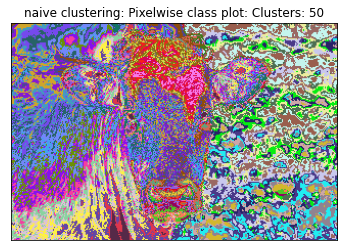

You will make some adjustments to your k-means clustering. After reflection, you will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

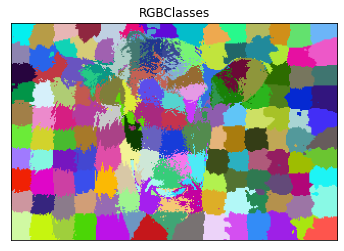

## Data

First, we download the MSRC labeled imaged database.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
!unzip --qq msrc_objcategimagedatabase_v1.zip

--2021-10-13 15:05:55--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.220.124.107, 2600:1402:6800:297::e59, 2600:1402:6800:283::e59
Connecting to download.microsoft.com (download.microsoft.com)|23.220.124.107|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M  96.8MB/s    in 0.4s    

2021-10-13 15:05:56 (96.8 MB/s) - ‘msrc_objcategimagedatabase_v1.zip’ saved [44119839/44119839]



For this assignment, we will only use the following images. We define the list below as `im_list`.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [ ]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im,title,xticks=[],yticks= [],isCv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm), 
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value  
    
    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot 
    
    Output: None
    Creates a plot    
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]
    
    plot_image(seg_img,title)
    
    return    

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust} 
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot: 
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the 
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

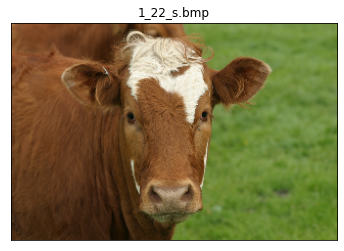

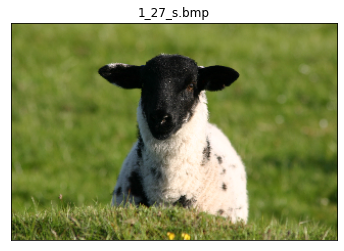

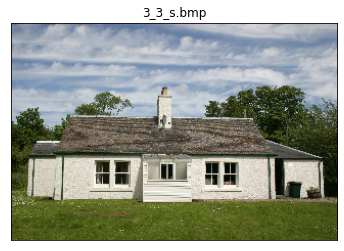

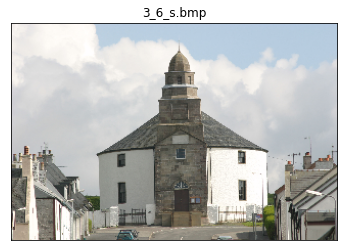

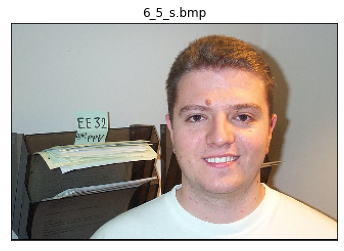

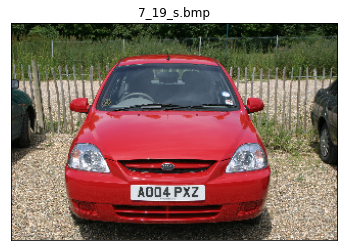

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

## Part 1: K-means on Image Pixels

For this portion of the assignment, you will attempt to identify superpixels by using k-means with various attributes of the image's pixels as inputs (r, g, b, and/or x, y).

### Section 1: Perform k-means on image pixels `(r, g, b)`.
 
The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 50`.




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control 

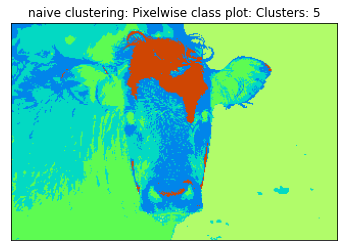

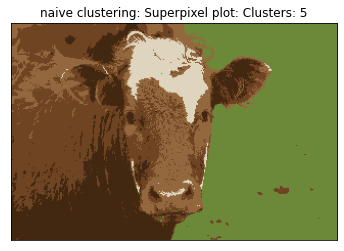

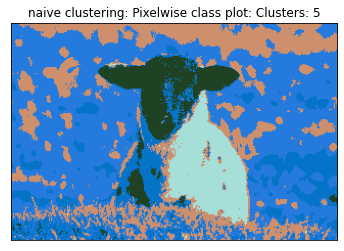

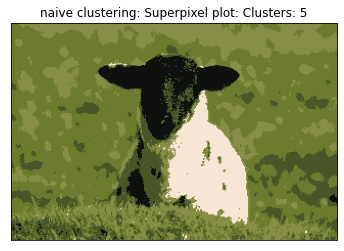

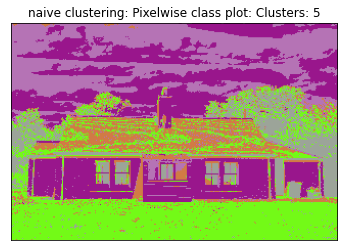

...

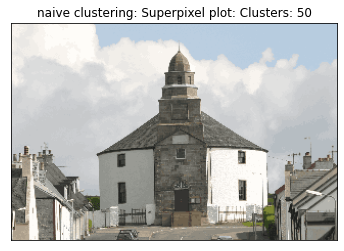

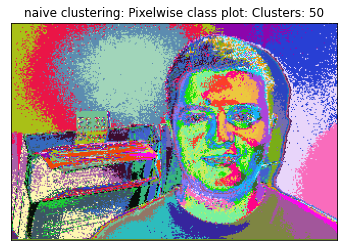

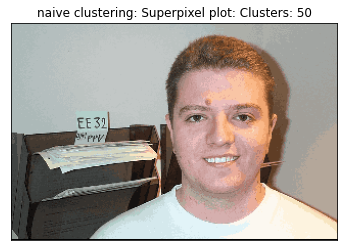

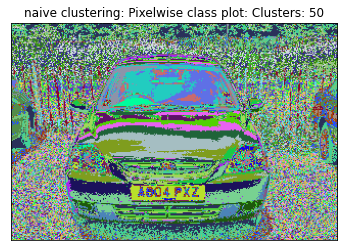

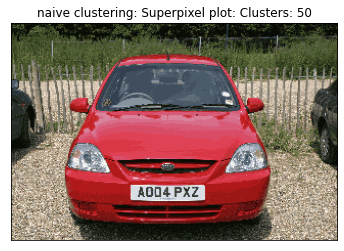

In [ ]:
from sklearn.cluster import KMeans
import numpy as  np


def cluster_pixels(im,k):    
    #TODO Pixelwise clustering   
    #assert 1==2," NOT IMPLEMENTED" 
    im = im/255.0
    X= im.reshape(-1,3)
    km = KMeans(n_clusters = k)
    km.fit(X)
    predicted_val = km.predict(X)
    segmap = predicted_val.reshape(im.shape[0],im.shape[1])
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    return segmap


for k in [5,10,50]:
  for i in im_list:
    im = cv2.imread(i)
    clusters = cluster_pixels(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Section 2: Perform k-means on image pixels `(r, g, b, x, y)`.

Instead of the clustering running on (r,g,b) values, run the clustering on (r,b,g,x,y).

Try with clusters = `5,10,25,50,150`. You only need to plot the cow (`1_22_s.bmp`).
____

In [ ]:
    im = cv2.imread(im_list[0])
    xvalues = np.arange(im.shape[1])
    yvalues = np.arange(im.shape[0])
    
    x_image, y_image = np.meshgrid(xvalues, yvalues)
    print(im.shape)
    im_new = np.stack((im[:,:,0],im[:,:,1],im[:,:,2],x_image, y_image),axis =2)
    type(im_new)

(213, 320, 3)


numpy.ndarray

In [ ]:
    new_image = np.zeros((im.shape[0], im.shape[1], im.shape[2]+2))
    print(new_image.shape)
    # print(new_image.shape)
    new_image[:,:,0] = im[:,:,0]
    new_image[:,:,1] = im[:,:,1]
    new_image[:,:,2] = im[:,:,2]

(213, 320, 5)


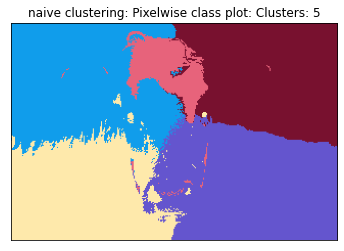

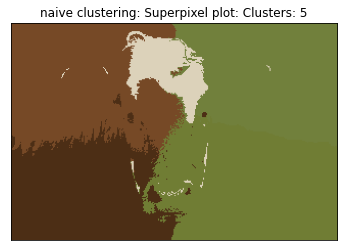

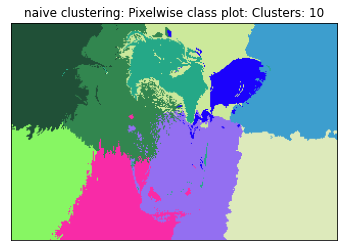

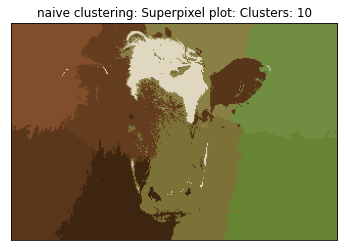

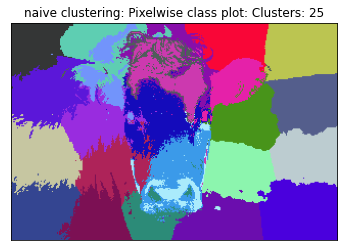

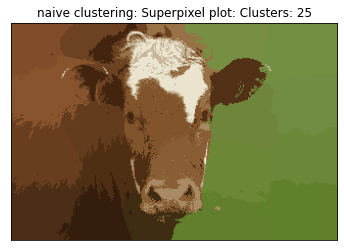

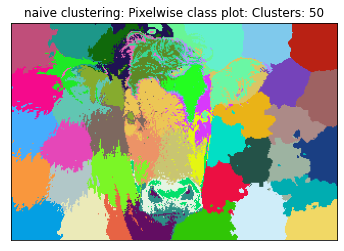

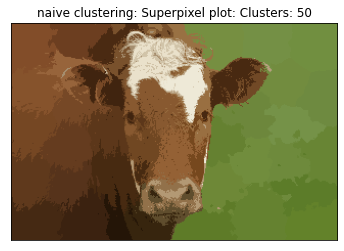

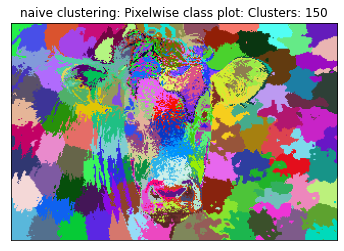

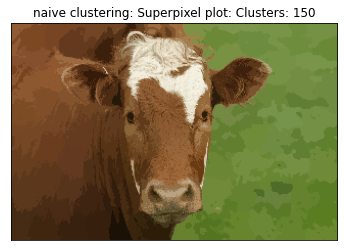

In [ ]:
#TODO: clustering r,b,g,x,y values 

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    
    
    x_values = np.arange(im.shape[1])
    y_values = np.arange(im.shape[0])
    x_image, y_image = np.meshgrid(xvalues, yvalues)

    im_5ch = np.stack((im[:,:,0],im[:,:,1],im[:,:,2],x_image, y_image),axis =2)
    im_5ch = im_5ch/255.0
    X= im_5ch.reshape(-1,5)
    
    km = KMeans(n_clusters = k)
    km.fit(X)
    predicted_val = km.predict(X)
    segmap = predicted_val.reshape(im.shape[0],im.shape[1])

    return segmap

for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))


### Section 3: What advantage did the `(r, g, b, x, y)` clustering give, compared to `(r, g, b)`? 

(r, g, b, x, y) helped us consider spatial closeness of pixels as well while grouping. Thus a cluster in the left corner would not include pixels in far right even if they were similarly colored.

### Section 4: K-means on image pixels `(r, g, b, x, y)` with weighted distances.

 Let: $cluster\_center_i$ be $i^{th}$ cluster center. $cluster\_center_i^{rgb}$ be the rgb value and $cluster\_center_i^{xy}$ be the corresponding coordinate of the pixel.
 
 Let $x_{rgb}$ be the the rgb value of a point
 Let $x_{xy}$ be the coordinate of $x_{rgb}$

Use the following distance function for k-means: $distance(x_{rgb},x_{xy}) = \lambda_1 * euclidean(x_{rgb},cluster\_center_{i}^{rgb})  + \lambda_2 * euclidean(x_{xy},cluster\_center_{i}^{xy})$

Find good values for $\lambda_1$ and $\lambda_2$ for 250 clusters.

With those good values, **plot results for all 6 images in `im_list`.**

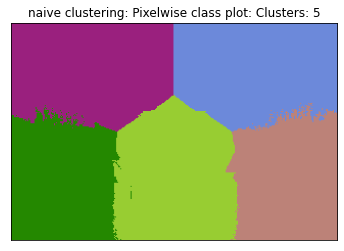

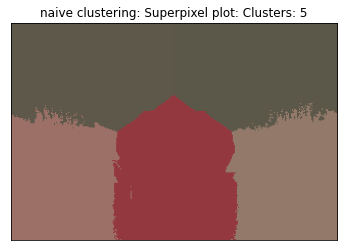

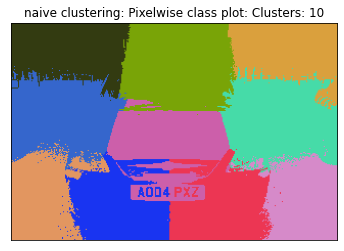

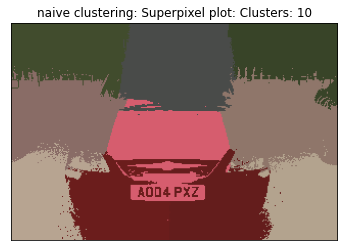

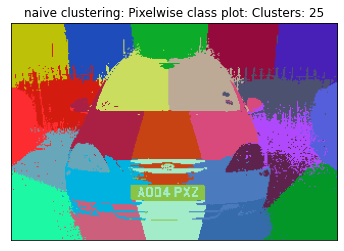

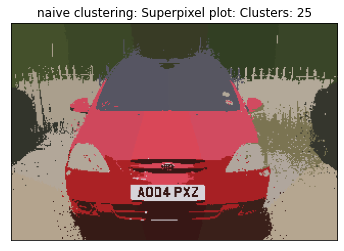

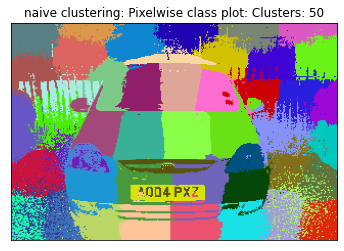

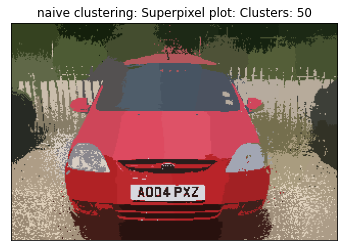

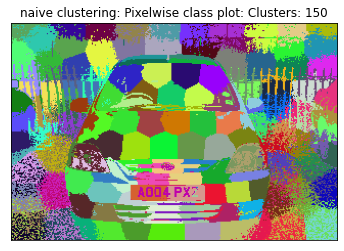

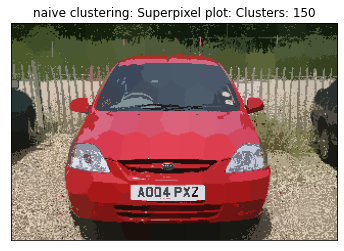

In [ ]:
#TODO: clustering r,b,g,x,y values with lambdas
def cluster_weighted_rgbxy(im,k,lambda1,lambda2):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    im = im * lambda1
    
    
    x_values = np.arange(im.shape[1])
    y_values = np.arange(im.shape[0])
    x_image, y_image = np.meshgrid(xvalues, yvalues)
    x_image = x_image * lambda2
    y_image = y_image * lambda2

    im_5ch = np.stack((im[:,:,0],im[:,:,1],im[:,:,2],x_image, y_image),axis =2)
    im_5ch = im_5ch/255.0
    X= im_5ch.reshape(-1,5)
    
    km = KMeans(n_clusters = k)
    km.fit(X)
    predicted_val = km.predict(X)
    segmap = predicted_val.reshape(im.shape[0],im.shape[1])
  
    return segmap

for k in [5, 10, 25, 50, 150]:
    clusters = cluster_weighted_rgbxy(im,k,0.3,1)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))


### Section 5: Replicate SLIC

It doesn't look like we have a very favourable outcome with superpixels simply being implemented. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [ ]:
def compute_gradient(im):
  im_lab_pad = np.pad(im_lab, [(1, 1), (1, 1), (0, 0)], mode='constant')

  im_x_minus_1 =  im_lab_pad[1:-1, 0:-2, :]
  im_x_plus_1 =   im_lab_pad[1:-1, 2:  , :]
  im_y_minus_1 =  im_lab_pad[0:-2, 1:-1, :]
  im_y_plus_1 =   im_lab_pad[2:  , 1:-1, :]

  grad_x = la.norm(im_x_plus_1 - im_x_minus_1, axis = 2) 
  grad_y = la.norm(im_y_plus_1 - im_y_minus_1, axis = 2) 
  grad = grad_x + grad_y

  return grad

In [ ]:
def compute_dist(v1, v2,m ,S):
  d_lab = np.sqrt(np.sum(np.square(v1[0:3] - v2[0:3])))
  d_xy = np.sqrt(np.sum(np.square(v1[3:] - v2[3:])))
  dist = d_lab + (m/S)*d_xy
  return dist

In [ ]:
def find_near_centroids(this_centroid, centroids, S):
  # print(this_centroid.shape)
  this_x, this_y = this_centroid[3], this_centroid[4]
  near_centroids = np.empty_like(this_centroid)
  for centroid in centroids:
    # print(centroid[5])
    x,y = centroid[3],centroid[4]
    if (((this_x - S) <= x <= (this_x + S)) and ((this_y - S) <= y <= (this_y + S))):
      # print(centroid[5])
      near_centroids = np.vstack((near_centroids, centroid)) 
  return near_centroids



In [ ]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using  
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S. 
####  Assign to nearest cluster
##calculate new cluster center 
 

def SLIC(im, K):
    """
    Input arguments: 
    im: image input
    k: number of cluster segments

    
    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..
    
    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    im = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)
    seg = np.zeros((im.shape[0],im.shape[1]))
    distance_pixels = np.full((im.shape[0], im.shape[1]),fill_value=np.inf)

    im_lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)
    im_grad = compute_gradient(im_lab)

    m=10
    
    xvalues = np.arange(im_lab.shape[1])
    yvalues = np.arange(im_lab.shape[0])
    x_image, y_image = np.meshgrid(xvalues, yvalues)
    im_5ch = np.stack((im_lab[:,:,0],im_lab[:,:,1],im_lab[:,:,2],x_image, y_image),axis =2)

    S = int (np.sqrt(im[:,:,0].size/ K))

    centroid_mat_rows = im_5ch.shape[0] // S
    centroid_mat_cols = im_5ch.shape[1] // S

    centroid_mat = np.zeros((centroid_mat_rows, centroid_mat_cols, im_5ch.shape[2]))
    for centroid_mat_col in range(centroid_mat_cols):
            for centroid_mat_row in range(centroid_mat_rows):
                im_row = S//2 + centroid_mat_row*S
                im_col = S//2 + centroid_mat_col*S
                centroid_mat[centroid_mat_row, centroid_mat_col, :] = im_5ch[im_row, im_col, :] 

    for centroid_mat_cols in range(centroid_mat_cols):
            for centroid_mat_row in range(centroid_mat_rows):
                im_row = S//2 + centroid_mat_row*S
                im_col = S//2 + centroid_mat_col*S
                nxn_neighborhood = im_grad[im_row-1:im_row+2, im_col-1:im_col+2]
                r,c = np.where(nxn_neighborhood == np.min(nxn_neighborhood))
                centroid_mat[centroid_mat_row, centroid_mat_col, :] = im_5ch[im_row -1 + r[0], im_col -1 + c[0],:]

    centroids = centroid_mat.reshape(-1,5)
    labels = np.arange(centroids.shape[0]).reshape(-1,1)
    labelled_centroids = np.hstack((centroids,labels))

    n_iters = 20
    iter = 0
    while iter<n_iters:

      for centroid in labelled_centroids:
        x_centroid, y_centroid = int(centroid[3]), int(centroid[4])
        near_centroids = find_near_centroids(centroid,labelled_centroids,S)

        for row in range(y_centroid - S, y_centroid +S +1):
          for col in range(x_centroid- S, x_centroid +S +1):
            for near_centroid in near_centroids:
              D = compute_dist(im_5ch[row,col,:], near_centroid[:-1], m, S)
              if D < distance_pixels[row,col]:
                distance_pixels[row,col] = D
                seg[row,col] = near_centroid[5]


      seg = seg.reshape(seg.shape[0],seg.shape[1],1)

      for label in labels:
        mask = np.where(seg == label, 1, 0)
        label_count = np.count_nonzero(mask == 1)
        if label_count == 0:
          continue
        masked = np.where(mask == 1, im_5ch, 0)
        sum = np.sum(np.sum(masked, axis=0), axis=0)
        new_centroid = sum/label_count
        new_centroid = np.append(new_centroid,label)
        labelled_centroids[label] = new_centroid
        
        iter+=1
        

    seg = np.squeeze(seg, axis=2)
    return seg, labelled_centroids


With SLIC implemented, plot results for all 6 images.

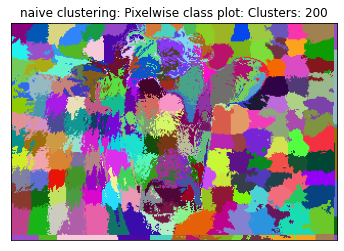

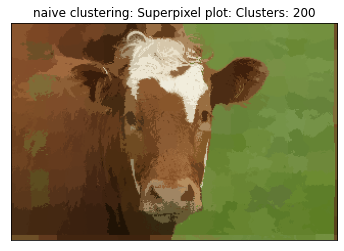

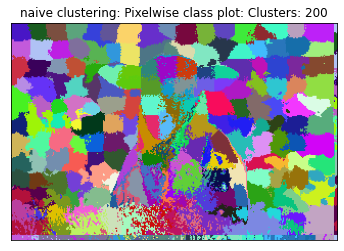

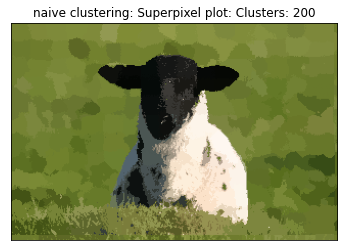

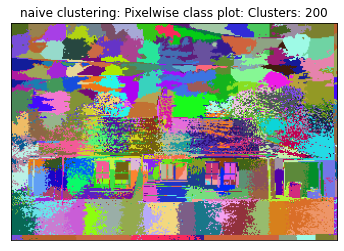

...

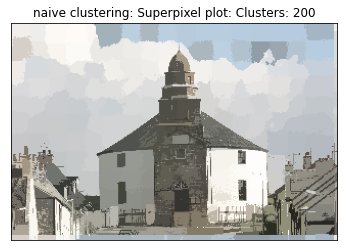

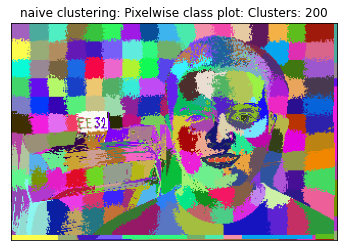

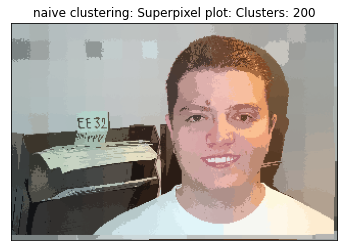

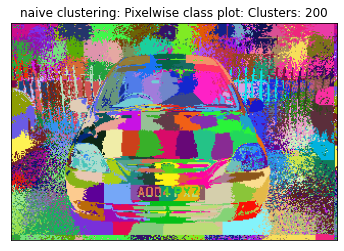

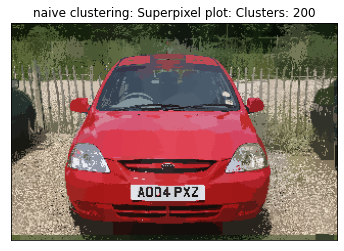

In [ ]:
## TODO: Call our plot functions with your SLIC results for all 6 images
k = 200
for i in im_list:
    im = cv2.imread(i)
    clusters, _ = SLIC(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Section 6: Enforce connectivity
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster 

Plot results for the 6 images.


In [ ]:
def enforce_connectivity(segmap,centroids):
  # values, counts = np.unique(segmap, return_counts=True)
  # thresh = 300
  # masked_values = np.where(counts < thresh, values, 0)
  # small_labels = masked_values[np.where(masked_values!=0)]
  # for label in small_labels:
  #   new_label = label+1
  #   if new_label not in small_labels:
  #     segmap[segmap==label] = new_label
  m=10
  S= int (np.sqrt(segmap.size/ 200))
  values, counts = np.unique(segmap, return_counts=True)
  thresh = 400
  masked_values = np.where(counts < thresh, values, 0)
  small_labels = masked_values[np.where(masked_values!=0)]


  for label in small_labels:
    this_centroid = centroids[int(label)]
    distance = np.inf
    for centroid in centroids:
      if (centroid[5]!=label) and (centroid[5] not in small_labels):
        D = compute_dist(this_centroid[:-1], centroid[:-1], m, S )
        if D < distance:
          distance = D
          new_label = centroid[5]

    segmap[segmap==label] = new_label

  return segmap

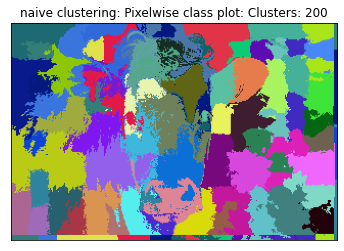

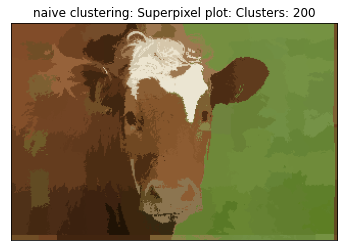

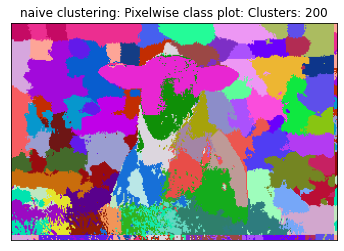

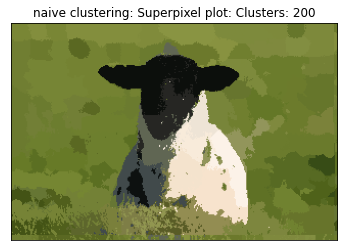

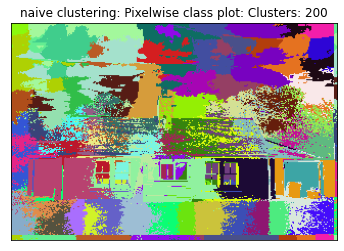

...

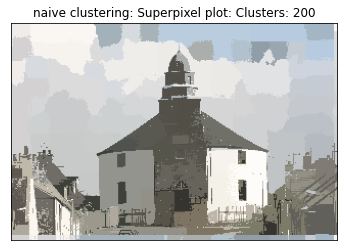

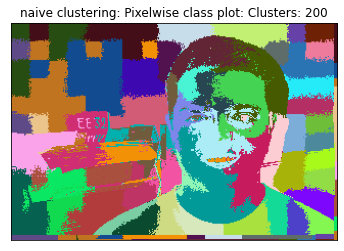

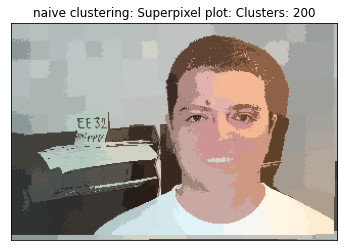

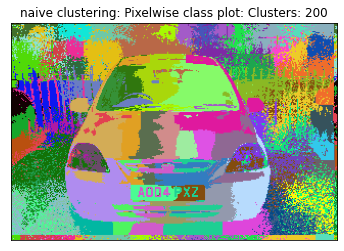

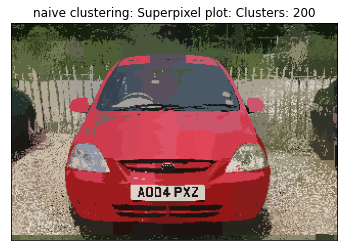

In [ ]:
k = 200
for i in im_list:
    im = cv2.imread(i)
    segmap,centroids = SLIC(im,k)
    clusters = enforce_connectivity(segmap,centroids)
    rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))